A ideia a tentar algumas transformacoes para augmentar o dataset que sera criado seja usando imagens reais ou imagens simuladas. E possivel utilizar tecnicas de segmentacao, deteccao de bordas/arestas para facilitar a deteccao de buracos. Talvez expandir de buracos para falhas em geral nos pavimentos.

In [2]:
from PIL import Image
from PIL import ImageOps
import matplotlib.pyplot as plt
import numpy as np

In [3]:
def show_image(original: Image.Image, ppImages: list, title:str, image_size:tuple = (10,10)):
    rows = len(ppImages)
    fig, axs = plt.subplots(rows,2, figsize = image_size)
    for i, image in enumerate(ppImages):
    
        axs[i,0].imshow(original)
        axs[i,1].imshow(image)
        axs[i,0].set_title("Original")
        axs[i,1].set_title(title[i])

def pre_process_image(image: Image.Image):
    pp_image = []
    title = []
    pp_image.append(ImageOps.mirror(image)); title.append("Imagem Espelhada")
    pp_image.append(ImageOps.flip(image)); title.append("Imagem invertida")
    pp_image.append(ImageOps.grayscale(image)); title.append("Image Escala preto e branco")
    pp_image.append(ImageOps.solarize(image, threshold=50)); title.append("Imagem solarizada")
    pp_image.append(ImageOps.grayscale(ImageOps.solarize(image, threshold=50))); title.append("Imagem solarizada -> Escala de preto e branco")
    
    return pp_image, title

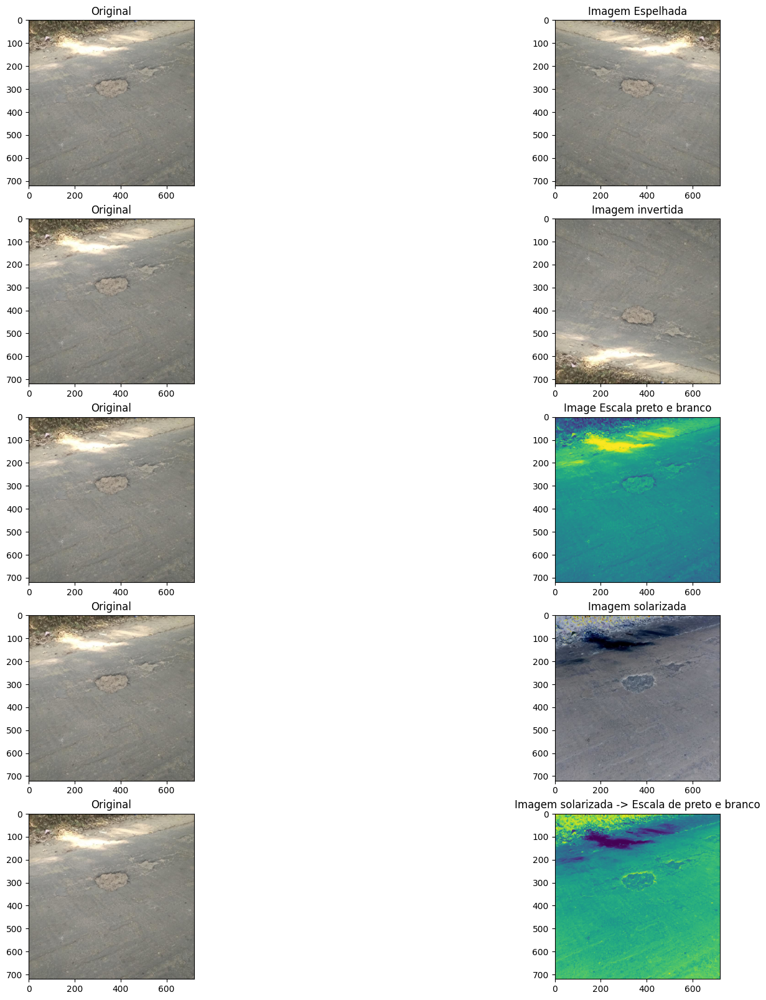

In [4]:
path = "files/img/img-44_jpg.rf.c0be863d6030f5d0cb241331c14ee532.jpg"
image = Image.open(path)

pp_image, title = pre_process_image(image)
show_image(image, pp_image, title, (20,20))
image_name = "image1.jpg"
pp_image[len(pp_image)-1].save("files/img/"+image_name)

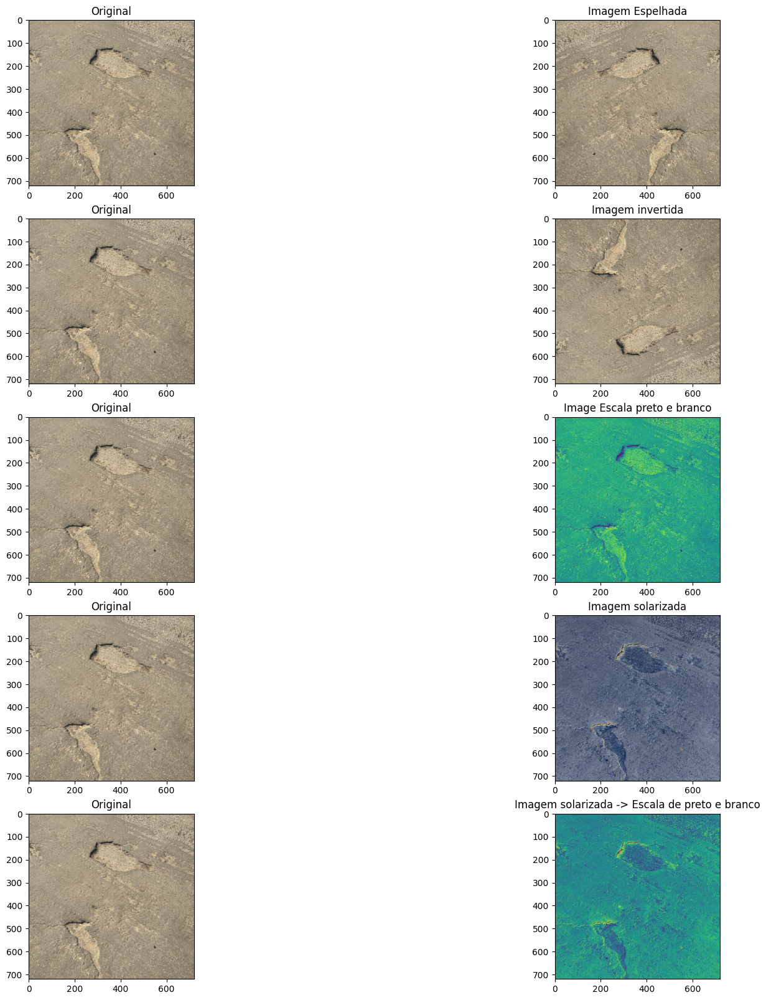

In [5]:
path = "files/img/img-43_jpg.rf.a63cf022f8ba7dbadc62c5d274547b79.jpg"
image = Image.open(path)

pp_image, title = pre_process_image(image)
show_image(image, pp_image, title, (20,20))
image_name = "image2.jpg"
pp_image[len(pp_image)-1].save("files/img/"+image_name)

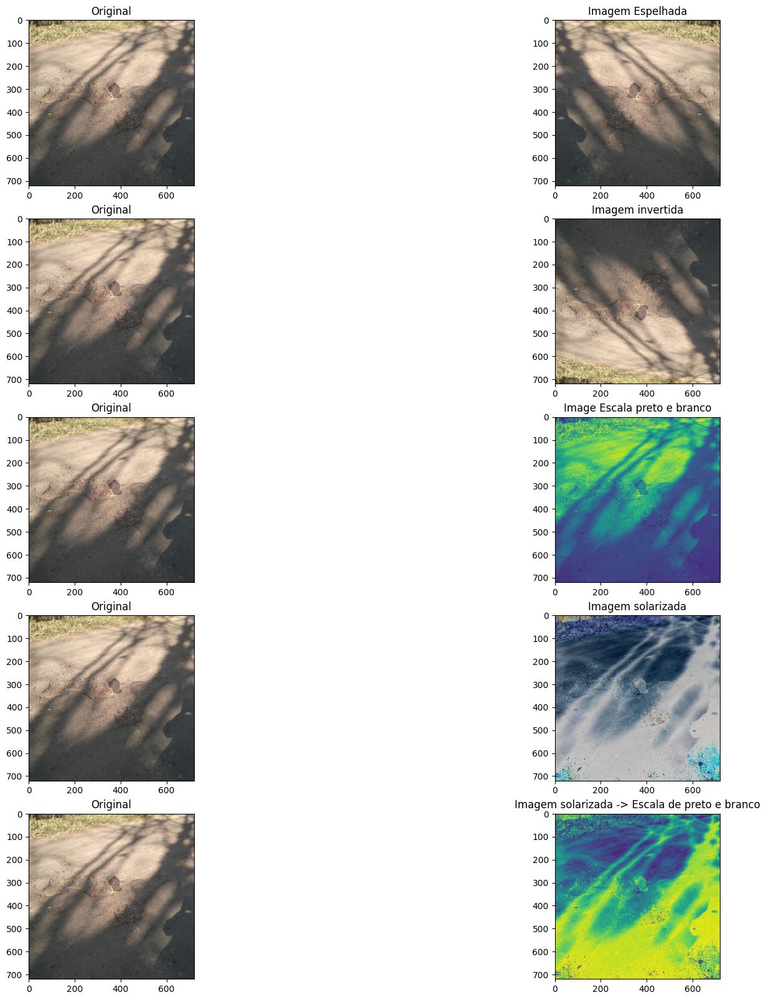

In [6]:
path = "files/img/img-42_jpg.rf.532fb8eb05b1efc570c5e4165e614201.jpg"
image = Image.open(path)

pp_image, title = pre_process_image(image)
show_image(image, pp_image, title, (20,20))
image_name = "image3.jpg"
pp_image[len(pp_image)-1].save("files/img/"+image_name)

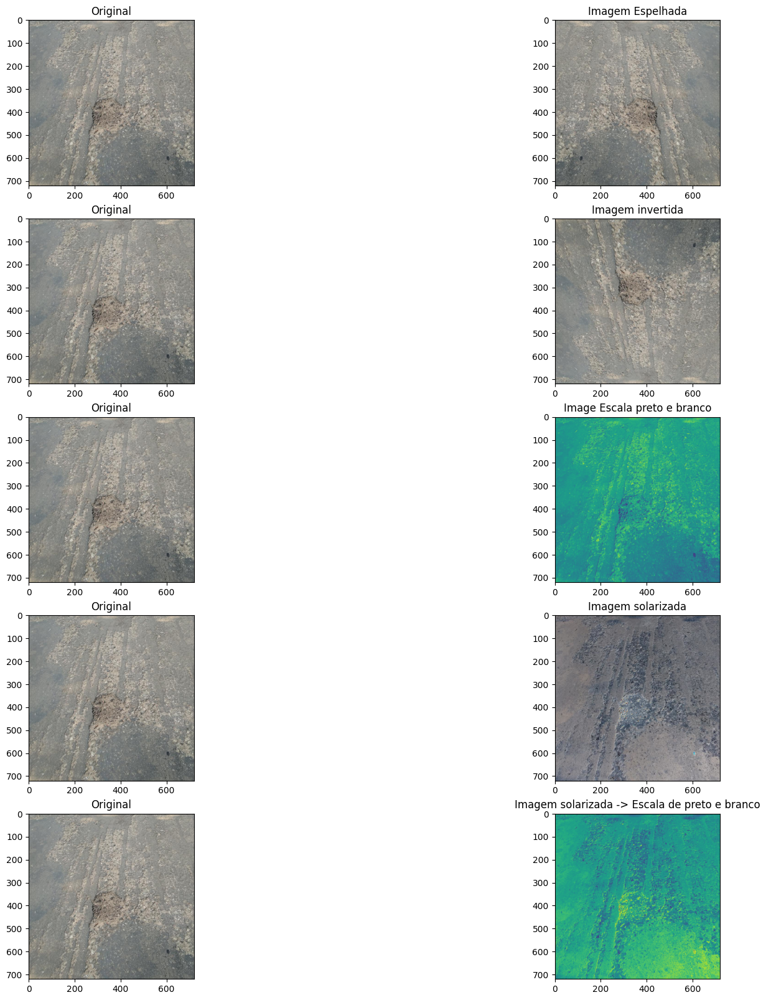

In [7]:
path = "files/img/img-36_jpg.rf.47f0fb502327ec69d5a041581727a149.jpg"
image = Image.open(path)

pp_image, title = pre_process_image(image)
show_image(image, pp_image, title, (20,20))
image_name = "image4.png"
pp_image[len(pp_image)-1].save("files/img/"+image_name)

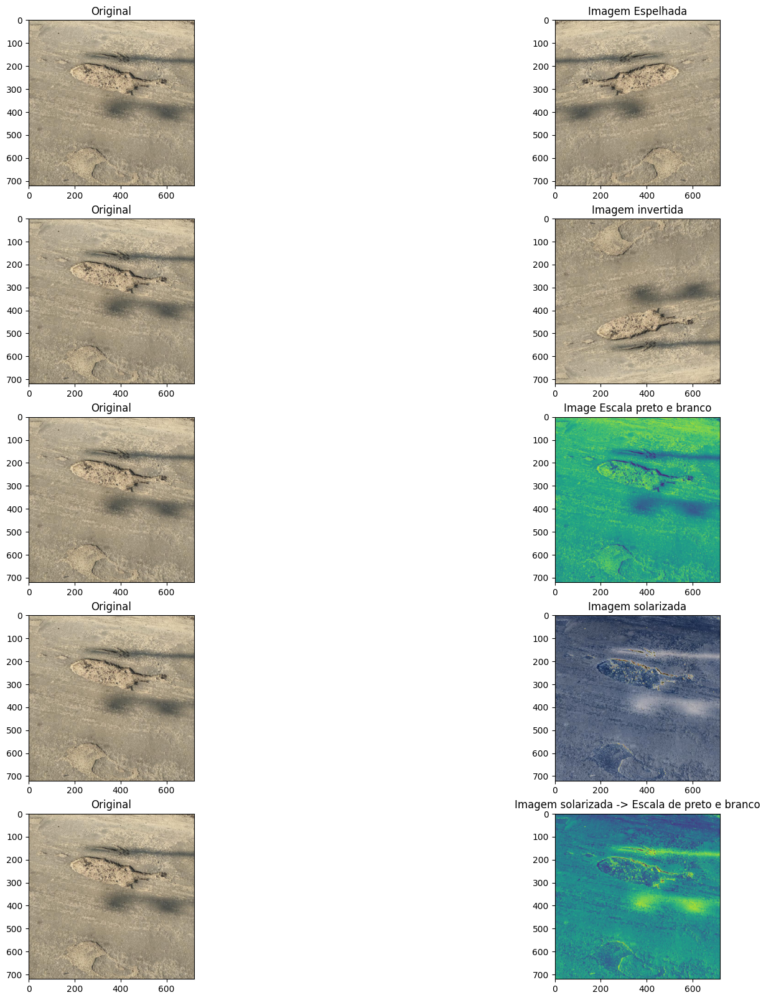

In [8]:
path = "files/img/img-23_jpg.rf.e6aa0daf83e72ccbf1ea10eb6a6ab3bd.jpg"
image = Image.open(path)

pp_image, title = pre_process_image(image)
show_image(image, pp_image, title, (20,20))
image_name = "image5.jpg"
pp_image[len(pp_image)-1].save("files/img/"+image_name)

Talvez seja possivel remover as sombras das analises. Uma das principais falhas na deteccao de falhas nos pavimentos eh a presenca de corpos estranhos, como sombras.

A primeira sequencia de imagens nao possui sombras, mas sim um raio de luz. Quando aplicado os filtros de solarizacao e greyscale, a parte de imagem cuja incidencia solar ocorre fica transforma-se em uma mancha escura que pode ser retirada da imagem atravez de um threshold. Na sequencia acima, as fotos da 3 sequencia de imagem possuem muitas sombras, que ganham um aspecto florescente apos aplicacao dos filtro. Isso pode ser utilizado para remocao de sombras da analise atraves de um threshold? Talves um threshold dinamico poderia ser testado.

Detteccao de bordas

In [9]:
import cv2 as cv
def edge_detector(argv) -> np.array:
    
    window_name = ('Sobel Demo - Simple Edge Detector')
    scale = 1
    delta = 0
    ddepth = cv.CV_16S
    
 
    """
        if len(argv) < 1:
        print ('Not enough parameters')
        print ('Usage:\nmorph_lines_detection.py < path_to_image >')
        return -1
    """

    # Load the image
    src = cv.imread(argv, cv.IMREAD_COLOR)
 
    # Check if image is loaded fine
    if src is None:
        print ('Error opening image: ' + argv[0])
        return -1
    
 
    
    src = cv.GaussianBlur(src, (3, 3), 0)
    
 
    
    gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
    
 
    
    grad_x = cv.Sobel(gray, ddepth, 1, 0, ksize=3, scale=scale, delta=delta, borderType=cv.BORDER_DEFAULT)
 
    # Gradient-Y
    grad_y = cv.Scharr(gray,ddepth,0,1)
    #grad_y = cv.Sobel(gray, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv.BORDER_DEFAULT)
    
 
    
    abs_grad_x = cv.convertScaleAbs(grad_x)
    abs_grad_y = cv.convertScaleAbs(grad_y)
    
 
    
    grad = cv.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
    
 
    
    #cv.imshow(window_name, grad)
    #cv.waitKey(0)
    
 
    return grad

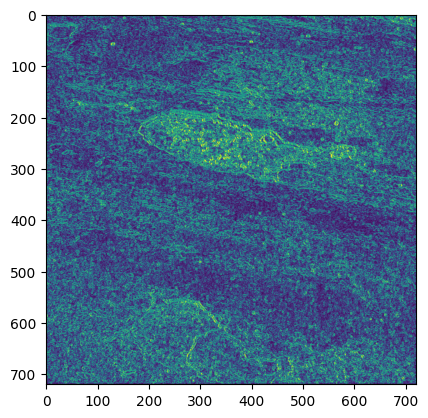

In [10]:
output = edge_detector("files/img/img-23_jpg.rf.e6aa0daf83e72ccbf1ea10eb6a6ab3bd.jpg")
plt.imshow(output)
plt.show()

## CDT test to pothole images

In [11]:
import pytranskit as cdt
import cv2 as cv2
import matplotlib.pyplot as plt
import numpy as np

from mpl_toolkits.mplot3d import Axes3D

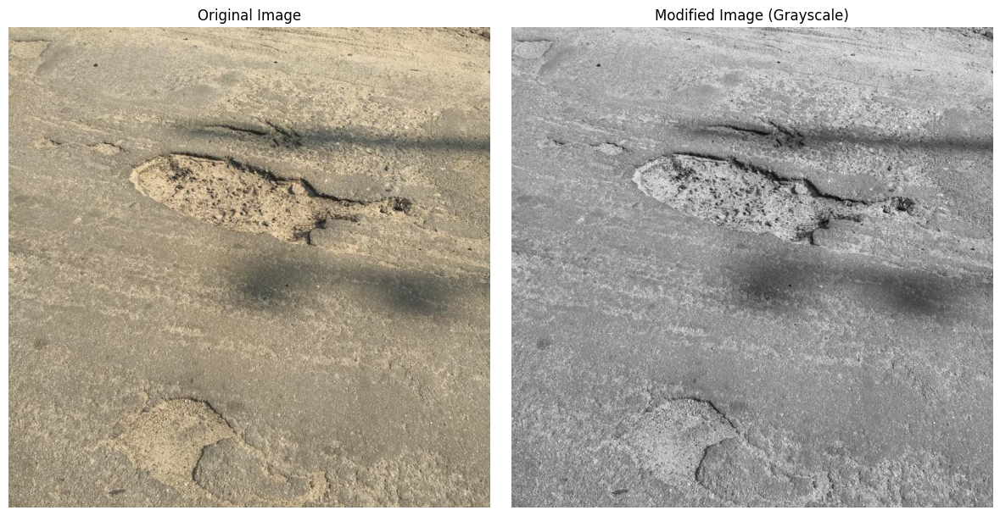

In [12]:

def display_images_side_by_side(image_path: str) :
    # Read the image
    original_image = cv2.imread(image_path)
    if original_image is None:
        print("Error: Could not read the image file.")
        return
    
    # Convert the image from BGR to RGB for correct plotting
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    
    # Perform a modification (e.g., converting to grayscale)
    # apply cdt here.
    modified_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    
    # Create the plot
    plt.figure(figsize=(12, 6))
    
    # Display the original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title("Original Image")
    plt.axis("off")
    
    # Display the modified image
    plt.subplot(1, 2, 2)
    plt.imshow(modified_image, cmap='gray')
    plt.title("Modified Image (Grayscale)")
    plt.axis("off")
    
    # Show the plot inline
    plt.tight_layout()
    plt.show()

# Example usage: Replace 'your_image_path.jpg' with the path to your image file
display_images_side_by_side('files/img/img-23_jpg.rf.e6aa0daf83e72ccbf1ea10eb6a6ab3bd.jpg')


In [213]:
def distribution_2d_curve(image_path: str, lower_threshold=50, upper_threshold=150) -> None:
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Could not read the image file.")
        return

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Pre-processing: Apply Gaussian blur and median filter
    median_blur = cv2.medianBlur(gray_image, 5)

    # Apply Canny edge detection
    edges = cv2.Canny(median_blur, lower_threshold, upper_threshold)

    # Convert edges to a probability density function (PDF)
    pdf_image = signal_to_pdf(edges)

    # Generate a grid using x and y axes for the 3D surface plot
    x_shape = gray_image.shape[1]  # Width
    y_shape = gray_image.shape[0]  # Height
    x_pixels = np.arange(0, x_shape, 1)
    y_pixels = np.arange(0, y_shape, 1)
    X, Y = np.meshgrid(x_pixels, y_pixels)
    Z = pdf_image

    # Plotting the results
    plt.figure(figsize=(18, 6))

    # Plot the original RGB image
    plt.subplot(1, 3, 1)
    original_image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(original_image_rgb)
    plt.title("Original RGB Image")
    plt.axis("off")

    # Plot the edges after Canny filter
    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap="gray")
    plt.title("Canny Edges")
    plt.axis("off")

    # Plot the 3D PDF chart
    ax = plt.subplot(1, 3, 3, projection='3d')
    surface = ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title("3D Probability Density Chart")
    ax.set_xlabel("X-axis (pixel)")
    ax.set_ylabel("Y-axis (pixel)")
    ax.set_zlabel("PDF Value")
    #plt.colorbar(surface, ax=ax, shrink=0.5, aspect=8)  # Add colorbar for the surface plot
    ax.view_init(-90, -90)
    # Display the plot
    plt.tight_layout()
    plt.show()

In [261]:
lt = 10
ut = 350

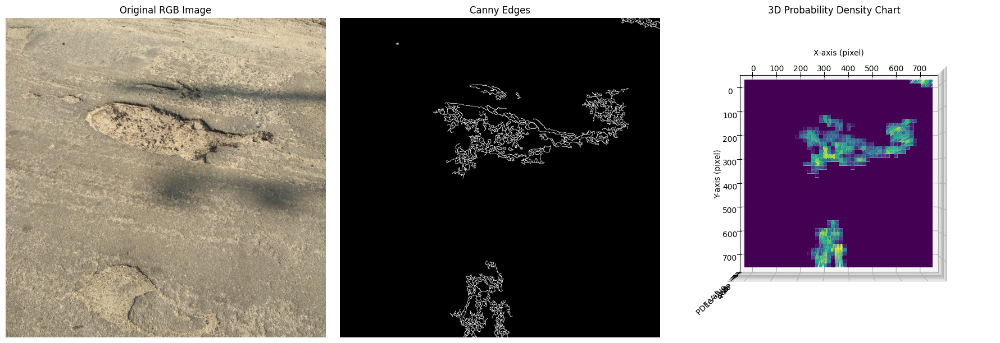

In [262]:
distribution_2d_curve('files/img/img-23_jpg.rf.e6aa0daf83e72ccbf1ea10eb6a6ab3bd.jpg', lower_threshold=lt, upper_threshold=ut)

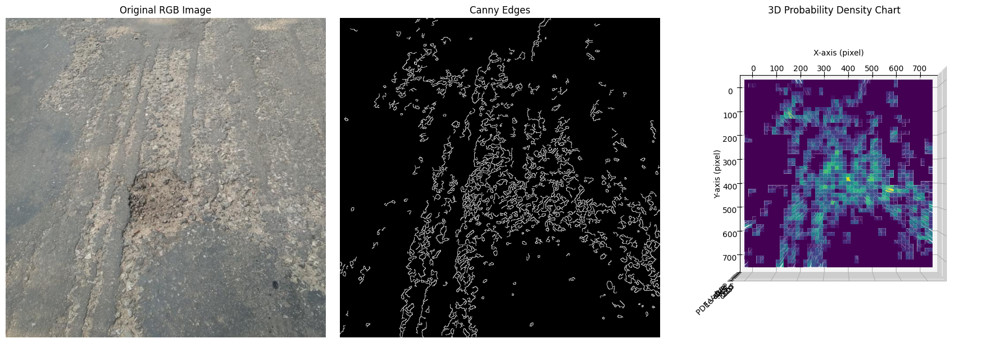

In [263]:
distribution_2d_curve("files/img/img-36_jpg.rf.47f0fb502327ec69d5a041581727a149.jpg")

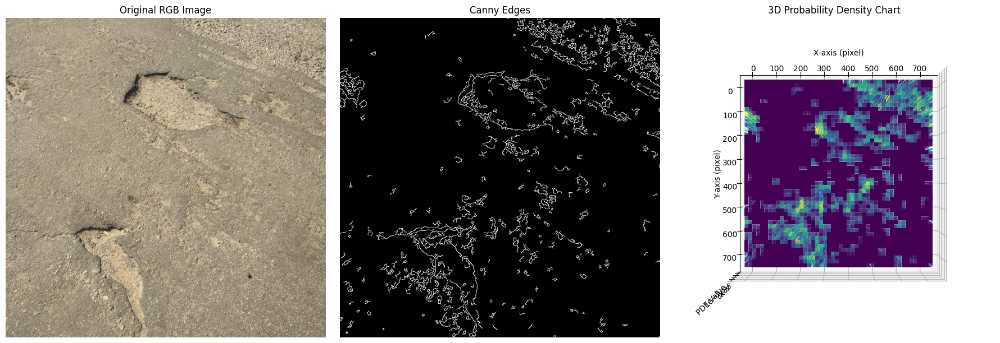

In [264]:
distribution_2d_curve("files/img/img-43_jpg.rf.a63cf022f8ba7dbadc62c5d274547b79.jpg")

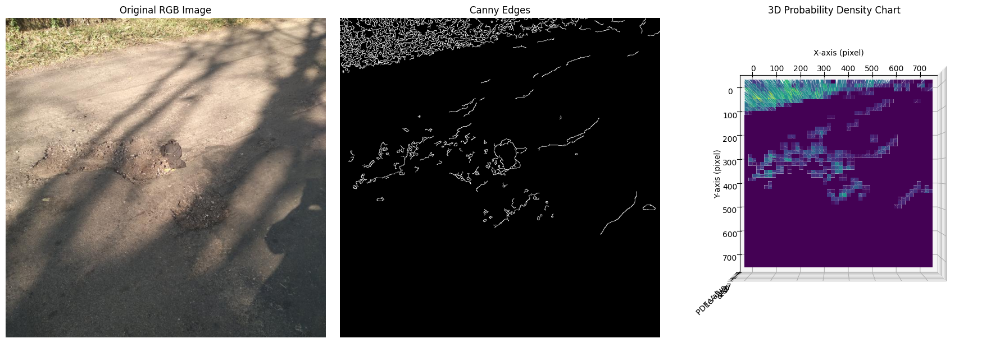

In [265]:
distribution_2d_curve("files/img/img-42_jpg.rf.532fb8eb05b1efc570c5e4165e614201.jpg")